# Introduction

This is a jupyter notebook that is designed to train an object detection for detecting faces and classifying if they are wearing mask or no mask.

It is built based on [Focal Loss for Dense Object Detection](https://arxiv.org/abs/1708.02002) from Facebook team.

It is also built with google colab, you may need to include some google colab's dependencies in your notebook or simply run them online in google colab environment. It is more advised to run in google colab as some features may not be supported in jupyter notebook.

# Preparation

## Install and import the required dependencies

In [32]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
# !pip install -U  'git+https://github.com/rafaelpadilla/Object-Detection-Metrics/blob/master/requirements.txt'
!git clone https://github.com/rafaelpadilla/Object-Detection-Metrics.git 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-0sbv551q
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-0sbv551q
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=267003 sha256=0ebb97ab3c2c4491e0641cd7753c03bb8d5ec44710da553be4c54351fda5c7da
  Stored in directory: /tmp/pip-ephem-wheel-cache-s0td74zp/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully uninstalled pycocotools-2.0


fatal: destination path 'Object-Detection-Metrics' already exists and is not an empty directory.
1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [33]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [0]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

import os
from shutil import copyfile

Download the datasets

In [35]:
!wget https://cloud.tsinghua.edu.cn/f/4279772e0ea7499faa42/?dl=1 -O face_mask.zip

--2020-06-13 14:29:02--  https://cloud.tsinghua.edu.cn/f/4279772e0ea7499faa42/?dl=1
Resolving cloud.tsinghua.edu.cn (cloud.tsinghua.edu.cn)... 101.6.8.7
Connecting to cloud.tsinghua.edu.cn (cloud.tsinghua.edu.cn)|101.6.8.7|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cloud.tsinghua.edu.cn/seafhttp/files/54ffab7a-72b3-4ac8-9f50-2684972fa95c/face_mask.zip [following]
--2020-06-13 14:29:03--  https://cloud.tsinghua.edu.cn/seafhttp/files/54ffab7a-72b3-4ac8-9f50-2684972fa95c/face_mask.zip
Reusing existing connection to cloud.tsinghua.edu.cn:443.
HTTP request sent, awaiting response... 200 OK
Length: 800641476 (764M) [application/zip]
Saving to: ‘face_mask.zip’

face_mask.zip       100%[===================>] 763.55M  17.4MB/s    in 46s     

2020-06-13 14:29:48 (16.7 MB/s) - ‘face_mask.zip’ saved [800641476/800641476]



Unzip the datasets

In [36]:
!unzip face_mask.zip > /dev/null

replace face_mask/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


Remove the zip file to free up spaces

In [0]:
os.remove("face_mask.zip")

# Run a pre-trained detectron2 model

Let's show a random image from the dataset

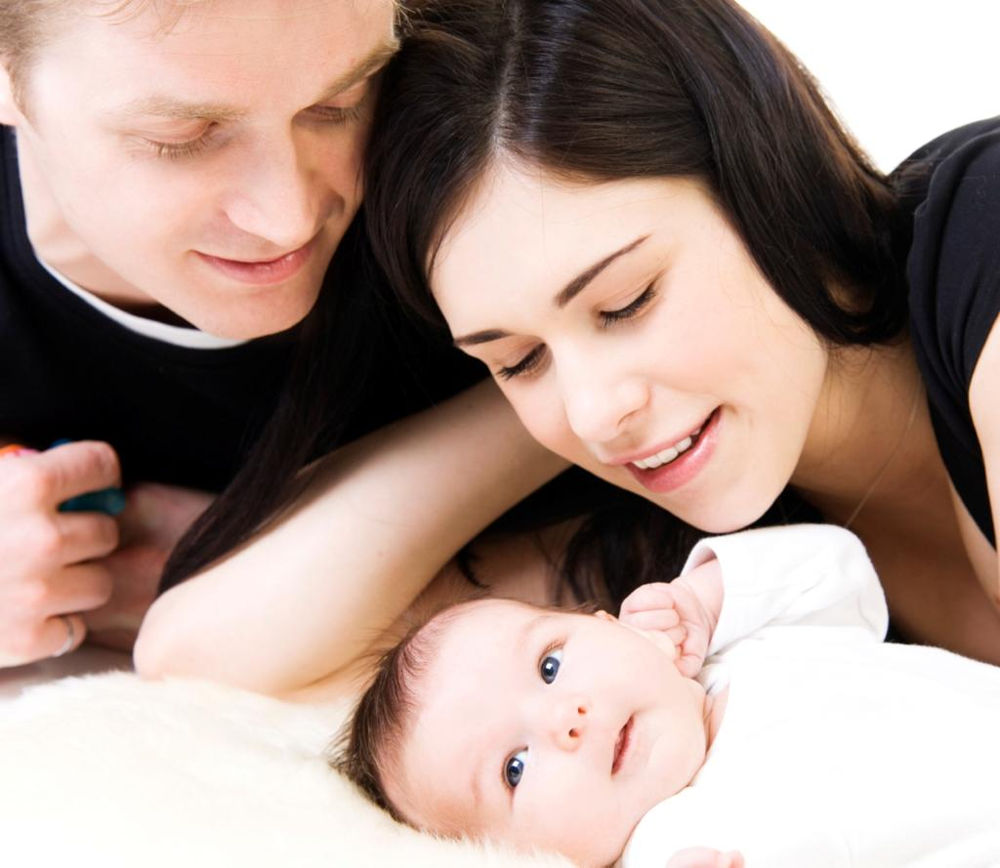

In [38]:
im = cv2.imread("face_mask/train/19_Couple_Couple_19_173.jpg")
cv2_imshow(im)

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image. We used the pretrained model of retinanet to have a view of what we are dealing with.

In [39]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_1x.yaml"))
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_1x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


look at the outputs. See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification


In [40]:
print(outputs["instances"].pred_classes)
print(outputs["instances"].pred_boxes)

tensor([0, 0, 0], device='cuda:0')
Boxes(tensor([[159.4134,  10.7127, 993.2985, 846.4562],
        [ 11.4601,   8.0586, 594.1155, 785.8192],
        [358.5439, 571.9446, 887.3199, 877.4015]], device='cuda:0'))


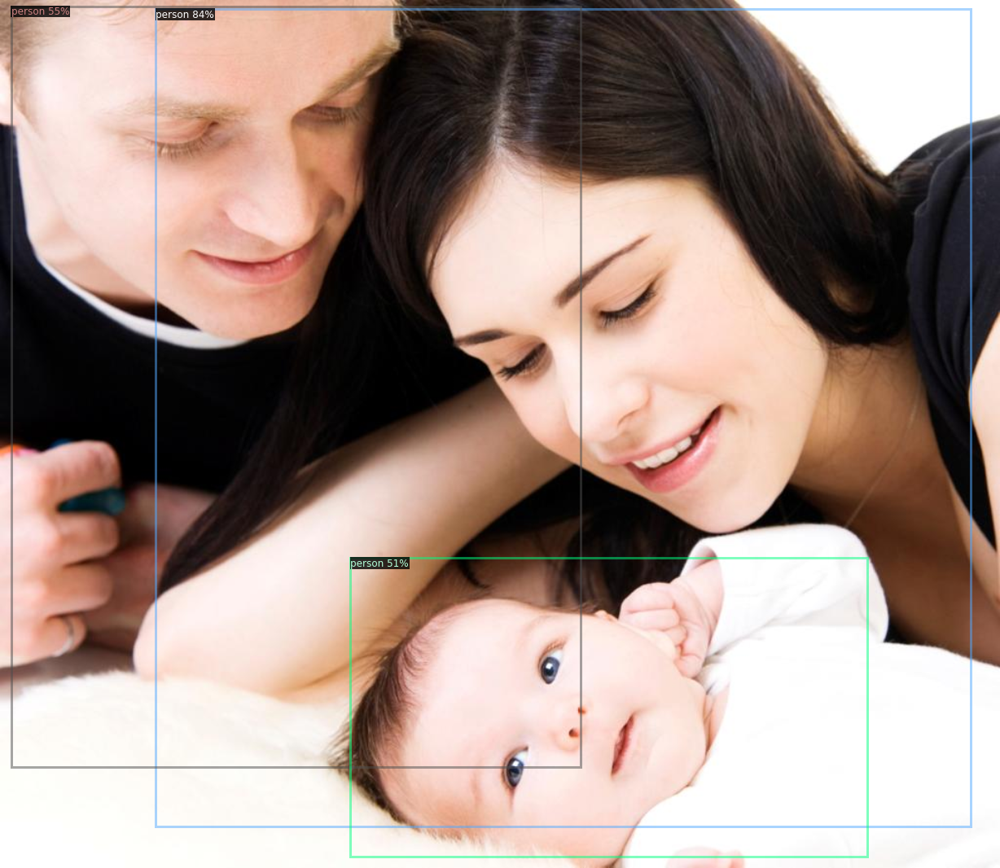

In [41]:
# We can use `Visualizer` to draw the predictions on the image.
# print(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]))
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use the face_mask dataset from AIZOO(https://github.com/AIZOOTech/FaceMaskDetection).
which has two classes: face_mask and face.
We'll train a face_mask/face object detection model from random weights.

Note that COCO dataset does not have the "face_mask" category. We'll be able to recognize this new class in a few minutes.

## Prepare the dataset

Register the face and face_mask dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. 

In [0]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode

def get_facemask_dict(img_dir,jsonName):
  json_file = os.path.join("face_mask",img_dir, jsonName)
  with open(json_file) as f:
    imgs_anns = json.load(f)

  dataset_dicts = []
  for idx, v in enumerate(imgs_anns['images']):
    record = {}
    filename = os.path.join("face_mask",img_dir, v['id'])
    height, width = cv2.imread(filename).shape[:2]

    record["file_name"] = filename
    record["image_id"] = idx
    record["height"] = height
    record["width"] = width
    objs = []
    for _, annos in enumerate(imgs_anns['annotations']):
      if annos['image_id'] == v['id']:
        data = annos['bbox']
        obj = {
        "bbox": data,
        "bbox_mode": BoxMode.XYXY_ABS,
        "segmentation": annos['segmentation'],
        "category_id": annos['category_id']-1,
        }
        objs.append(obj)
    record["annotations"] = objs
    dataset_dicts.append(record)
      
  return dataset_dicts

# from detectron2.data import DatasetCatalog, MetadataCatalog
# for d in ["train", "val"]:
#   print(d)
#   DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
#   MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
# balloon_metadata = MetadataCatalog.get("balloon_train")

Regitster the datasets to catalog according to if its for training or validation purpose.



In [0]:
# print(balloon_metadata)
from detectron2.data import DatasetCatalog, MetadataCatalog
DatasetCatalog._REGISTERED.clear()
for d in ["train", "val"]:
  DatasetCatalog.register("face_mask_" + d, lambda d=d: get_facemask_dict(d, d+".json"))
  MetadataCatalog.get("face_mask_" + d).set(thing_classes=["face","face_mask"])
face_mask_metadata = MetadataCatalog.get("face_mask_train")

In [0]:
train_dicts = get_facemask_dict("train","train.json")
test_dicts = get_facemask_dict("val","val.json")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:

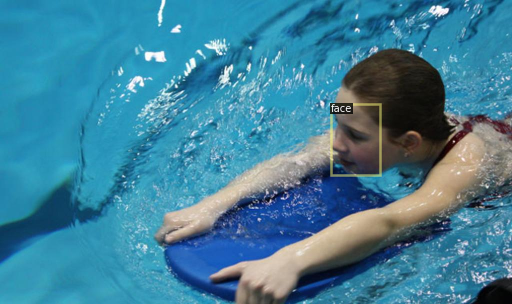

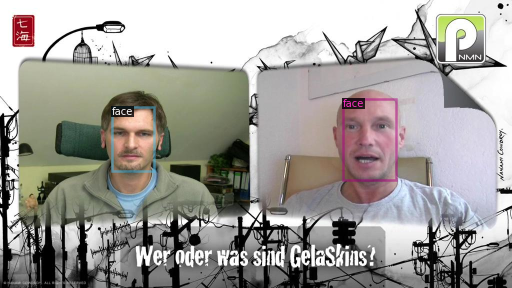

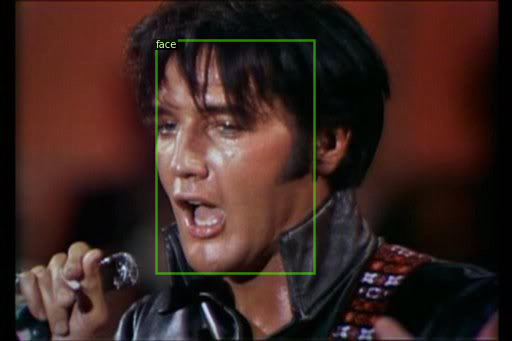

In [45]:
for d in random.sample(train_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=face_mask_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train!

Here we will be doing some fine tuning on the parameters for training. It takes up to 20000 iterations to fine tuned an empty faster RCNN model. And it would take about 3.5 hours to train 20000 iterations. For showing purpose, lets run for 100 iterations that would just take a few minutes!

The model we will be using here is retinanet_R_50_FPN_1x.yaml model which is the most commonly used model in the field of Retinanet. 

And most importantly, we will run without any pretrained.

In [46]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
cfg.clear()
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_1x.yaml"))
cfg.DATASETS.TRAIN = ("face_mask_train",)
# cfg.DATASETS.TEST = ("face_mask_val",)
cfg.DATASETS.TEST = ()
cfg.MODEL.RETINANET.FOCAL_LOSS_GAMMA = 2.0
cfg.MODEL.RETINANET.FOCAL_LOSS_ALPHA = 0.25

# cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/retinanet_R_50_FPN_1x.yaml")
cfg.DATALOADER.NUM_WORKERS = 8
# cfg.MODEL.WEIGHTS = "./models/model_final_b796dc.pkl" # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 5
cfg.SOLVER.BASE_LR = 0.000002
cfg.SOLVER.MAX_ITER = 100 # 300 iterations seems good enough, but you can certainly train longer
cfg.SOLVER.WARMUP_ITERS = 200
cfg.MODEL.RETINANET.NUM_CLASSES = 2
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=True)
trainer.train()

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[06/13 14:31:23 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

In [47]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir output

Reusing TensorBoard on port 6006 (pid 723), started 1:25:21 ago. (Use '!kill 723' to kill it.)

<IPython.core.display.Javascript object>

# Inference & evaluation using the trained model

## Some trial
Now, let's run inference with the trained model on the face mask's validation dataset. First, let's create a predictor using the model we just trained:

In [0]:
from detectron2.config import get_cfg
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

We have pretrained one final model's weight with 20000 iterations, let's download it for use.

In [49]:
# Create target directory & all intermediate directories if don't exists
dirName = "model"
os.makedirs(dirName, exist_ok=True) 

# download the model's weight into the folder
!wget "https://cloud.tsinghua.edu.cn/f/817b9559279b4756880b/?dl=1" -O model/retinanet_weights_final.pth

--2020-06-13 14:32:20--  https://cloud.tsinghua.edu.cn/f/817b9559279b4756880b/?dl=1
Resolving cloud.tsinghua.edu.cn (cloud.tsinghua.edu.cn)... 101.6.8.7
Connecting to cloud.tsinghua.edu.cn (cloud.tsinghua.edu.cn)|101.6.8.7|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cloud.tsinghua.edu.cn/seafhttp/files/c6a7fa3e-76f5-4ce5-8c06-9597fbd89ebc/focal_loss_final.pth [following]
--2020-06-13 14:32:21--  https://cloud.tsinghua.edu.cn/seafhttp/files/c6a7fa3e-76f5-4ce5-8c06-9597fbd89ebc/focal_loss_final.pth
Reusing existing connection to cloud.tsinghua.edu.cn:443.
HTTP request sent, awaiting response... 200 OK
Length: 289998897 (277M) [application/octet-stream]
Saving to: ‘model/retinanet_weights_final.pth’

model/retinanet_wei 100%[===================>] 276.56M  17.8MB/s    in 17s     

2020-06-13 14:32:39 (16.0 MB/s) - ‘model/retinanet_weights_final.pth’ saved [289998897/289998897]



Some initializations:

In [50]:
cfg.DATASETS.TEST = ("face_mask_val",)
cfg.clear()
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_1x.yaml"))
cfg.MODEL.WEIGHTS = 'model/retinanet_weights_final.pth'
cfg.MODEL.RETINANET.FOCAL_LOSS_GAMMA = 2.0
cfg.MODEL.RETINANET.FOCAL_LOSS_ALPHA = 0.25
# cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/retinanet_R_50_FPN_1x.yaml")
cfg.DATALOADER.NUM_WORKERS = 8
cfg.MODEL.RETINANET.NUM_CLASSES = 2
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model

predictor = DefaultPredictor(cfg)

Loading config /usr/local/lib/python3.6/dist-packages/detectron2/model_zoo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


Then, we randomly select several samples to visualize the prediction results.

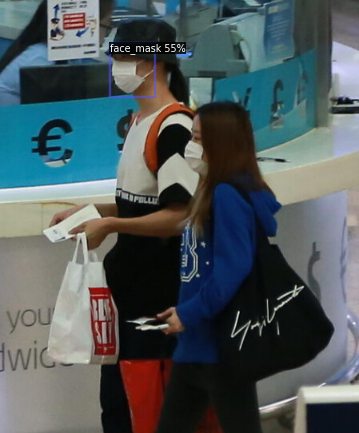

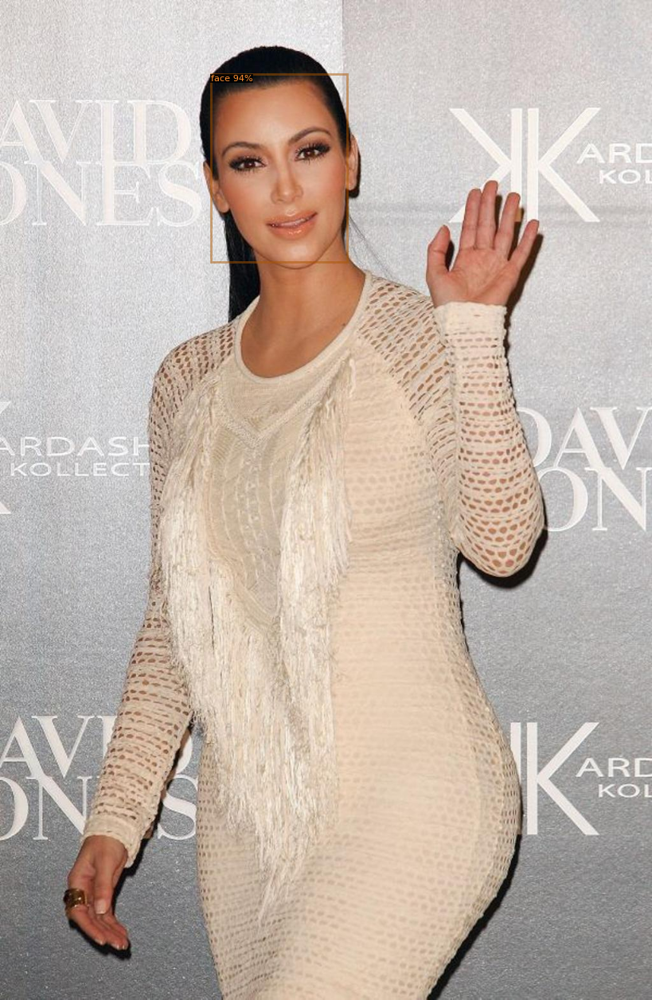

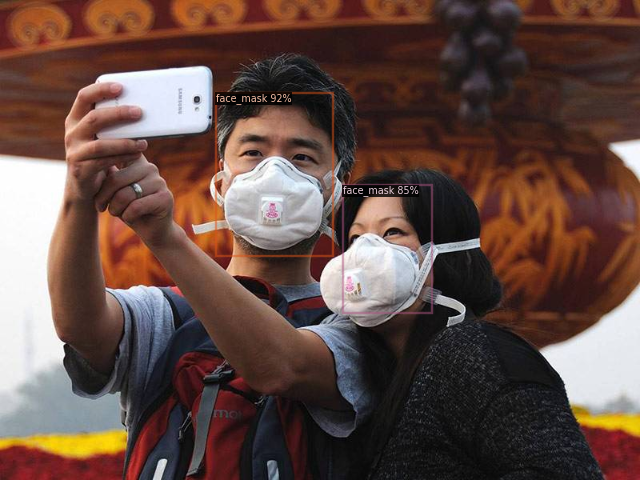

In [51]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(test_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=face_mask_metadata, 
                   scale=0.8
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

## Thorough inference

The above results seems nice, aren't they? Lets do a complete inference on the whole face_mask_val, and save the result for later assessment

In [0]:
from torch import IntTensor
from torch import tensor
import time
import tensorflow as tf
os.makedirs("detection", exist_ok=True) 

In [53]:
count = 0
elapsed = []
for d in test_dicts:    
  count = count + 1
  im = cv2.imread(d["file_name"])
  t = time.time()
  outputs = predictor(im)
  elapsed.append(time.time() - t)
  v = outputs["instances"]
  write_path = 'detection/' + os.path.basename(d["file_name"]).split(".")[0]  + '.txt'
  with open(write_path, 'w') as the_file:
    for i in range(len(v.pred_classes)):
      # what is it?
      if IntTensor.item(v.pred_classes[i]) == 0:
        string = "Face"
      else:
        string = "Mask"
      # score?
      string = string + " " + str(IntTensor.item(v.scores[i]))
      string = string + " " + ' '.join(map(str, v.pred_boxes[i].tensor.cpu().numpy().squeeze()))
      # print(string)
      the_file.write(string +'\n')

print("Verified " + str(count) + " pictures.")

Verified 1839 pictures.


In [54]:
print('The average time for detecting a photo is '+ str(np.mean(elapsed)) + ' seconds')

The average time for detecting a photo is 0.07445667644374199 seconds


In [0]:
import zipfile
def zipdir(path, ziph):
    # ziph is zipfile handle
    for root, dirs, files in os.walk(path):
        for file in files:
            ziph.write(os.path.join(root, file))

zipf = zipfile.ZipFile('detection_focal_loss_threshold_50.zip', 'w', zipfile.ZIP_DEFLATED)
zipdir('detection', zipf)
zipf.close()

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~50%. Not bad!

In [56]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("face_mask_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "face_mask_val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[06/13 14:35:32 d2.data.common]: Serializing 1839 elements to byte tensors and concatenating them all ...
[06/13 14:35:32 d2.data.common]: Serialized dataset takes 0.46 MiB
[06/13 14:35:32 d2.evaluation.evaluator]: Start inference on 1839 images
[06/13 14:35:33 d2.evaluation.evaluator]: Inference done 11/1839. 0.0581 s / img. ETA=0:01:47
[06/13 14:35:38 d2.evaluation.evaluator]: Inference done 95/1839. 0.0585 s / img. ETA=0:01:44
[06/13 14:35:43 d2.evaluation.evaluator]: Inference done 182/1839. 0.0578 s / img. ETA=0:01:37
[06/13 14:35:48 d2.evaluation.evaluator]: Inference done 271/1839. 0.0570 s / img. ETA=0:01:31
[06/13 14:35:53 d2.evaluation.evaluator]: Inference done 357/1839. 0.0570 s / img. ETA=0:01:26
[06/13 14:35:58 d2.evaluation.evaluator]: Inference done 444/1839. 0.0570 s / img. ETA=0:01:21
[06/13 14:36:03 d2.evaluation.evaluator]: Inference done 529/1839. 0.0572 s / img. ETA=0:01:16
[06/13 14:36:08 d2.evaluation.evaluator]: Inference done 616/1839. 0.0571 s / img. ETA=0:01

OrderedDict([('bbox',
              {'AP': nan,
               'AP50': nan,
               'AP75': nan,
               'APl': nan,
               'APm': nan,
               'APs': nan})])